In [3]:
# Standard python imports
import numpy as np
import matplotlib.pyplot as plt

import tidy3d as td

from tidy3d import web
from tidy3d.plugins.resonance import ResonanceFinder

# Second Harmonic Generation  

This notebook demonstrates how to use linear fields to calculate the nonlinear polarization and apply it as a source to investigate Second Harmonic Generation (SHG) in a 2D photonic crystal cavity.  

The workflow is divided as follows:  

1. Run a linear simulation with a [`GaussianPulse`](https://docs.flexcompute.com/projects/tidy3d/en/latest/api/_autosummary/tidy3d.GaussianPulse.html) source to determine the resonant frequency.  
2. Run a linear simulation with a [`ContinuousWave`](https://docs.flexcompute.com/projects/tidy3d/en/latest/api/_autosummary/tidy3d.ContinuousWave.html) at the resonant frequency to analyze the steady-state linear field.  
3. Use the steady-state field information to create the nonlinear polarization and apply it as the source for SHG.  

In this notebook, we will explore various features of Tidy3D, such as:  

- Importing geometries from a GDS file  .
- Anisotropic media.  
- Using [`ResonanceFinder`](https://www.flexcompute.com/tidy3d/examples/notebooks/ResonanceFinder/) to investigate a system’s resonance frequency. 
- Using a [`CustomCurrentSource`](https://docs.flexcompute.com/projects/tidy3d/en/latest/api/_autosummary/tidy3d.CustomCurrentSource.html). 

This notebook example was kindly shared by the [Brightlight Photonics](https://www.brightlightphotonics.com/) team.  

## Parameters definition    

Here, we define the global parameters for the simulation as well as the anisotropic medium.  

In [4]:
# Universal parameters

ep_hole = 1  # Dielectric constant of the holes

n_ordinary_1550nm = 2.564
n_extraordinary_1550nm = 2.608

n_ordinary_775nm = 2.607
n_extraordinary_775nm = 2.65

# Defining anisotropic materials
medium_xx_1550 = td.Medium(permittivity=n_ordinary_1550nm**2)
medium_yy_1550 = td.Medium(permittivity=n_ordinary_1550nm**2)
medium_zz_1550 = td.Medium(permittivity=n_extraordinary_1550nm**2)

mat_slab_1550 = td.AnisotropicMedium(
    xx=medium_xx_1550, yy=medium_yy_1550, zz=medium_zz_1550, name="mat_slab"
)
mat_hole_1550 = td.Medium(permittivity=ep_hole, name="mat_hole")

medium_xx_775 = td.Medium(permittivity=n_ordinary_775nm**2)
medium_yy_775 = td.Medium(permittivity=n_ordinary_775nm**2)
medium_zz_775 = td.Medium(permittivity=n_extraordinary_775nm**2)

mat_slab_775 = td.AnisotropicMedium(
    xx=medium_xx_775, yy=medium_yy_775, zz=medium_zz_775, name="mat_slab"
)
mat_hole_775 = td.Medium(permittivity=ep_hole, name="mat_hole")

a_lattice = 0.530
r_hole = 0.26
t_slab = 0.57
sidewall_angle = 0
sim_size = Lx, Ly, Lz = (a_lattice * 40, a_lattice * np.sqrt(3) / 2 * 12, 3)

To make the notebook more compact, the photonic crystal unit cell geometry will be imported from a GDS file.  

In [5]:
import gdstk

lib_loaded = gdstk.read_gds("misc/shg_geometry.gds")
all_cells = {c.name: c for c in lib_loaded.cells}

holes_geometry = [
    td.Geometry.from_gds(
        cell,
        axis=2,
        slab_bounds=(-t_slab * a_lattice / 2, t_slab * a_lattice / 2),
        gds_layer=0,
        gds_dtype=0,
    )
    for cell in all_cells.values()
]
holes_structures = [
    td.Structure(geometry=geo, medium=mat_hole_1550) for geo in holes_geometry
]

slab = td.Structure(
    geometry=td.Box(
        center=(0, 0, 0),
        size=(td.inf, td.inf, t_slab * a_lattice),
    ),
    medium=mat_slab_1550,
    name="slab",
)

structures_list = [slab] + holes_structures

## Gaussian pulse simulation

First, we define a [`PointDipole`](https://docs.flexcompute.com/projects/tidy3d/en/latest/api/_autosummary/tidy3d.PointDipole.html) source with Gaussian time dependency.

14:47:26 -03 WARNING: The monitor 'interval' field was left as its default      
             value, which will set it to 1 internally. A value of 1 means that  
             the data will be sampled at every time step, which may potentially 
             produce more data than desired, depending on the use case. To      
             reduce data storage, one may downsample the data by setting        
             'interval > 1' or by choosing alternative 'start' and 'stop' values
             for the time sampling. If you intended to use the highest          
             resolution time sampling, you may suppress this warning by         
             explicitly setting 'interval=1' in the monitor.                    

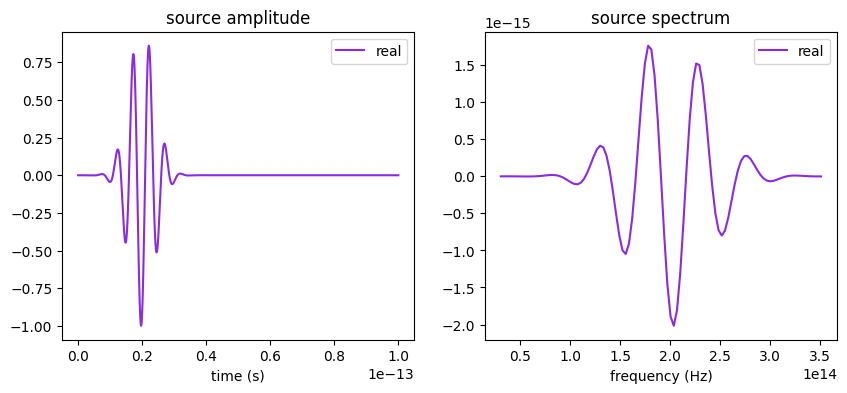

In [6]:
# Central frequency around which we'll look for the cavity mode (Hz)
freq0 = 1.908e14

# Source bandwidth (Hz)
fwidth = 4e13

# Simulation run time (s)
run_time = 10e-12

# Plot time dependence to verify when the source pulse decayed
source = td.PointDipole(
    center=(0, 0, 0),
    source_time=td.GaussianPulse(freq0=freq0, fwidth=fwidth),
    polarization="Ey",
)

# Starting time after the source has decayed
t_start = 10e-13

# Time series monitor for Q-factor computation
time_series_mnt = td.FieldTimeMonitor(
    center=[0, 0, 0], size=[0, 0, 0], start=t_start, name="time_series"
)

# Flux monitor to get the total dipole power.
flux_time = td.FluxTimeMonitor(
    center=(0, 0, 0), size=(0.8 * Lx, 0.8 * Ly, 0.8 * Lz), name="flux_time"
)

# Source pulse is much shorter than the simulation run_time defined above,
# so we only examine the signal up to a shorter time = 10e-13fs
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
source.source_time.plot(np.linspace(0, 1e-13, 2000), ax=ax[0])
source.source_time.plot_spectrum(times=np.linspace(0, 5e-13, 2000), ax=ax[1])
plt.show()

In [7]:
# Suppress warnings for some of the holes being too close to the PML
td.config.logging_level = "ERROR"

refine_box = td.MeshOverrideStructure(
    geometry=td.Box(center=(0, 0, 0), size=(td.inf, td.inf, t_slab * a_lattice)),
    dl=[None, None, t_slab * a_lattice / 12],
)

# Mesh step in x, y, z, in microns
steps_per_unit_length_xy = 15
steps_per_unit_length_z = 15
grid_spec = td.GridSpec(
    grid_x=td.AutoGrid(min_steps_per_wvl=steps_per_unit_length_xy),
    grid_y=td.AutoGrid(min_steps_per_wvl=steps_per_unit_length_xy),
    grid_z=td.AutoGrid(min_steps_per_wvl=steps_per_unit_length_z),
    override_structures=[refine_box],
)

sim = td.Simulation(
    size=sim_size,
    grid_spec=grid_spec,
    structures=structures_list,
    sources=[source],
    monitors=[time_series_mnt, flux_time],
    run_time=run_time,
    boundary_spec=td.BoundarySpec(
        x=td.Boundary.pml(), y=td.Boundary.pml(), z=td.Boundary.pml()
    ),
    symmetry=(1, -1, 1),
)

Total number of grid points (millions): 6.1


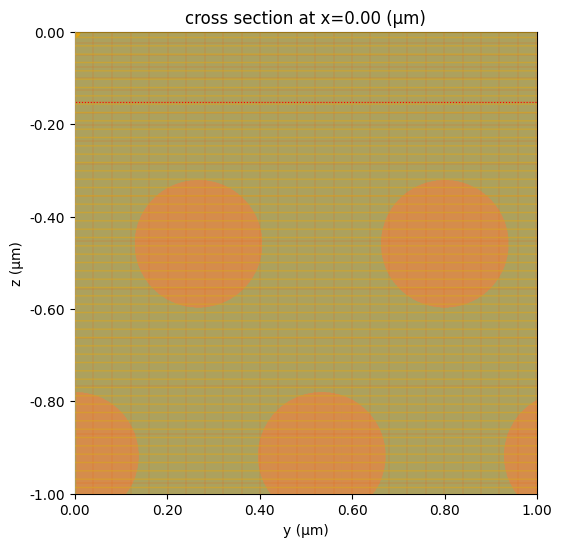

In [8]:
# Plot simulation and overlay grid in the xy planes
def plot_sim_grid(sim):
    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    sim.plot(z=0, ax=ax, monitor_alpha=0)
    sim.plot_grid(x=0, ax=ax, lw=0.4, colors="r")
    plt.ylim(-1, 0)
    plt.xlim(0, 1)
    print(f"Total number of grid points (millions): {sim.num_cells / 1e6:1.2}")

    return ax


plot_sim_grid(sim)
plt.show()

In [9]:
# Visualize simulation
sim.plot_3d()

In [10]:
# Running the simulation
sim_data = web.run(sim, task_name="1_fundamental_mode_spectrum")

14:47:30 -03 Created task '1_fundamental_mode_spectrum' with task_id            
             'fdve-ced4a185-c1fc-4cbc-b56b-fd0c6e115bed' and task_type 'FDTD'.

             View task using web UI at                                          
             ]8;id=343783;https://tidy3d.simulation.cloud/workbench?taskId=fdve-ced4a185-c1fc-4cbc-b56b-fd0c6e115bed\'https://tidy3d.simulation.cloud/workbench?]8;;\]8;id=500317;https://tidy3d.simulation.cloud/workbench?taskId=fdve-ced4a185-c1fc-4cbc-b56b-fd0c6e115bed\taskId]8;;\]8;id=343783;https://tidy3d.simulation.cloud/workbench?taskId=fdve-ced4a185-c1fc-4cbc-b56b-fd0c6e115bed\=]8;;\]8;id=556181;https://tidy3d.simulation.cloud/workbench?taskId=fdve-ced4a185-c1fc-4cbc-b56b-fd0c6e115bed\fdve]8;;\]8;id=343783;https://tidy3d.simulation.cloud/workbench?taskId=fdve-ced4a185-c1fc-4cbc-b56b-fd0c6e115bed\-ced4a185-c1f]8;;\
             ]8;id=343783;https://tidy3d.simulation.cloud/workbench?taskId=fdve-ced4a185-c1fc-4cbc-b56b-fd0c6e115bed\c-4cbc-b56b-fd0c6e115bed']8;;\.

             Task folder: ]8;id=933134;https://tidy3d.simulation.cloud/folders/folder-8147159a-783f-4689-bb3b-1505d3c642cf\'default']8;;\.

Output()

14:47:49 -03 Maximum FlexCredit cost: 0.047. Minimum cost depends on task       
             execution details. Use 'web.real_cost(task_id)' to get the billed  
             FlexCredit cost after a simulation run.

14:47:50 -03 status = success

Output()

14:47:58 -03 loading simulation from simulation_data.hdf5

Now, we will analyze the field time series data. As we can see, the resonances exhibit exponential decay, and the cavity resonance is clearly visible in the Fourier transform.  

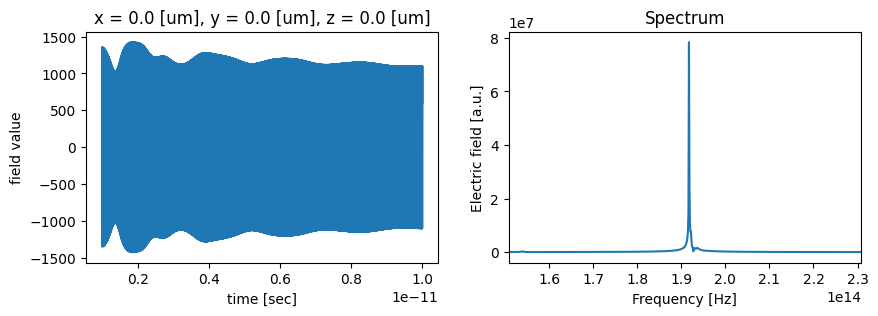

In [11]:
# Get data from the TimeMonitor
tdata = sim_data["time_series"]

time_series = tdata.Ey.squeeze()

# Get data from the TimeMonitor
tdata_flux = sim_data["flux_time"]


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

# Plot time dependence
time_series.plot(ax=ax1)

# Make frequency mesh and plot spectrum
dt = sim_data.simulation.dt

fmesh = np.linspace(-1 / dt / 2, 1 / dt / 2, time_series.size)
spectrum = np.fft.fftshift(np.fft.fft(time_series))

ax2.plot(fmesh, np.abs(spectrum))
ax2.set_xlim(freq0 - fwidth, freq0 + fwidth)
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Electric field [a.u.]")
ax2.set_title("Spectrum")


plt.show()

Now we can use [`ResonanceFinder`](https://www.flexcompute.com/tidy3d/examples/notebooks/ResonanceFinder/) to calculate the resonant frequency and Q-factor:

In [12]:
resonance_finder = ResonanceFinder(
    freq_window=(freq0 - fwidth / 2, freq0 + fwidth / 2), init_num_freqs=100
)
resonance_data = resonance_finder.run(sim_data["time_series"])
resonance_data.to_dataframe()

,decay,Q,amplitude,phase,error
freq,,,,,
1.916923e+14,1.583043e+10,38041.869915,633.257757,0.415743,0.000903
1.921704e+14,2.744605e+11,2199.664730,79.822426,-2.673820,0.007226
1.927407e+14,7.505830e+11,806.723293,82.303201,0.093524,0.006905
1.935228e+14,1.341245e+12,453.287507,52.900389,1.711574,0.042153


In [13]:
cavity_resonance_freq = float(resonance_data.freq[0])

## Continuous wave simulation

Now, we will excite the same cavity with a [`ContinuousWave`](https://docs.flexcompute.com/projects/tidy3d/en/latest/api/_autosummary/tidy3d.ContinuousWave.html) source until it reaches the steady-state regime.  


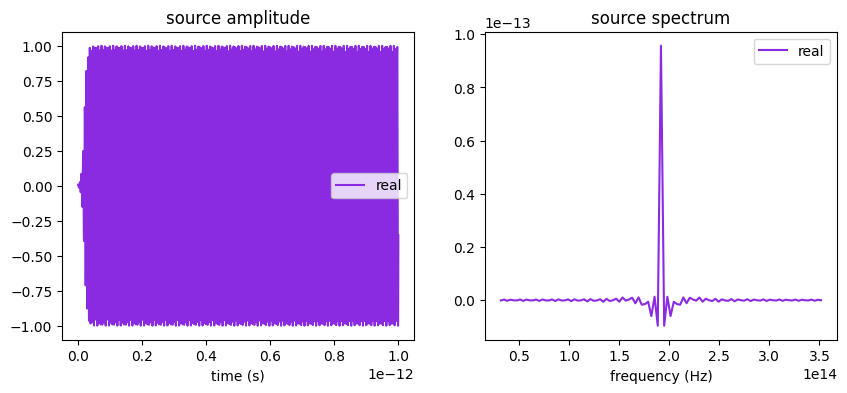

In [14]:
# Plot time dependence to verify when the source pulse decayed
source_continuous = td.PointDipole(
    center=(0, 0, 0),
    source_time=td.ContinuousWave(freq0=cavity_resonance_freq, fwidth=fwidth),
    polarization="Ey",
)

# Source pulse is much shorter than the simulation run_time defined above,
# so we only examine the signal up to a shorter time = 5e-13fs
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
source_continuous.source_time.plot(np.linspace(0, 10e-13, 2000), ax=ax[0])
source_continuous.source_time.plot_spectrum(times=np.linspace(0, 5e-13, 2000), ax=ax[1])
plt.show()

In [15]:
# Creating a FieldTimeMonitor and PermittivityMonitor that will be used for calculating the nonlinear polarization

field_mnt_time = td.FieldTimeMonitor(
    center=(0, 0, 0),
    size=(Lx, Ly, Lz),
    fields=["Ex", "Ey", "Ez"],
    start=run_time - 0.5 / freq0,
    interval=1,
    colocate=True,
    name="movie_monitor",
)

eps_monitor = td.PermittivityMonitor(
    center=(0, 0, 0), size=(Lx, Ly, Lz), freqs=[freq0], name="eps_monitor"
)

In [16]:
sim_continuous = sim.updated_copy(
    sources=[source_continuous],
    structures=structures_list,
    monitors=[time_series_mnt, field_mnt_time, flux_time, eps_monitor],
)

In [17]:
sim_data_cw = web.run(sim_continuous, task_name="no name", verbose=True)

14:48:05 -03 Created task 'no name' with task_id                                
             'fdve-95ea48df-790b-41d0-ae1a-4edd50f6a538' and task_type 'FDTD'.

             View task using web UI at                                          
             ]8;id=875875;https://tidy3d.simulation.cloud/workbench?taskId=fdve-95ea48df-790b-41d0-ae1a-4edd50f6a538\'https://tidy3d.simulation.cloud/workbench?]8;;\]8;id=506313;https://tidy3d.simulation.cloud/workbench?taskId=fdve-95ea48df-790b-41d0-ae1a-4edd50f6a538\taskId]8;;\]8;id=875875;https://tidy3d.simulation.cloud/workbench?taskId=fdve-95ea48df-790b-41d0-ae1a-4edd50f6a538\=]8;;\]8;id=232083;https://tidy3d.simulation.cloud/workbench?taskId=fdve-95ea48df-790b-41d0-ae1a-4edd50f6a538\fdve]8;;\]8;id=875875;https://tidy3d.simulation.cloud/workbench?taskId=fdve-95ea48df-790b-41d0-ae1a-4edd50f6a538\-95ea48df-790]8;;\
             ]8;id=875875;https://tidy3d.simulation.cloud/workbench?taskId=fdve-95ea48df-790b-41d0-ae1a-4edd50f6a538\b-41d0-ae1a-4edd50f6a538']8;;\.

             Task folder: ]8;id=67501;https://tidy3d.simulation.cloud/folders/folder-8147159a-783f-4689-bb3b-1505d3c642cf\'default']8;;\.

Output()

14:48:24 -03 Maximum FlexCredit cost: 0.070. Minimum cost depends on task       
             execution details. Use 'web.real_cost(task_id)' to get the billed  
             FlexCredit cost after a simulation run.

14:48:25 -03 status = success

Output()

14:48:51 -03 loading simulation from simulation_data.hdf5

First, we plot the field profile to visualize the resonant mode.  

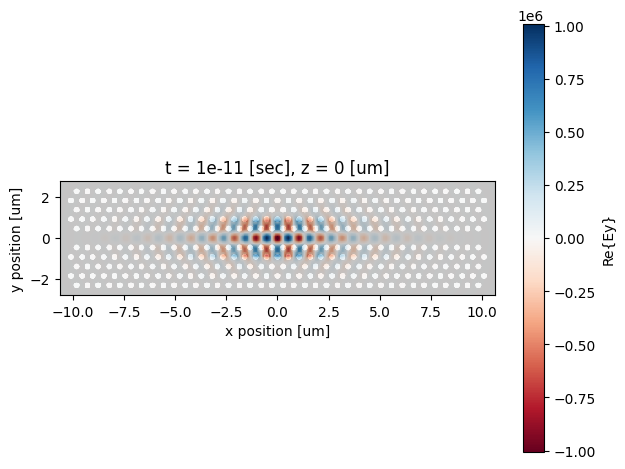

In [18]:
ax = sim_data_cw.plot_field(
    "movie_monitor",
    "Ey",
    "real",
    t=sim_data_cw["movie_monitor"].Ey.t[-1],
    z=0,
    robust=False,
    eps_alpha=0,
)

eps_plot = sim_data_cw["eps_monitor"].eps_xx.sel(z=0).isel(f=0)

ax.pcolormesh(eps_plot.x, eps_plot.y, eps_plot.T.real, alpha=0.2, cmap="binary")

plt.show()

## Second Harmonic simulation

Now, we will identify the maximum value of the field to use it for calculating the nonlinear polarization.  

In [19]:
max_field_coord = sim_data_cw["movie_monitor"].Ey.idxmax(dim="t")

Ey_array = np.array(sim_data_cw["movie_monitor"].Ey)
integrated_ey_time = np.sum(Ey_array, axis=(0, 1, 2))
time_coord_max_field = np.argmax(integrated_ey_time)

In [20]:
Ex = sim_data_cw["movie_monitor"].Ex.isel(t=time_coord_max_field).drop_vars("t")
Ey = sim_data_cw["movie_monitor"].Ey.isel(t=time_coord_max_field).drop_vars("t")
Ez = sim_data_cw["movie_monitor"].Ez.isel(t=time_coord_max_field).drop_vars("t")

To normalize to the target power of 0.003 Watts, we create a scaling factor using the flux mean value in time domain.

In [21]:
flux = sim_data_cw["flux_time"].flux.squeeze()

target_power = 10e-3  # W
radiated_power = float(np.mean(flux[int(len(flux) * 0.99) : -1]))
scale_factor_power = target_power / radiated_power

Defining the relevant polarization tensor

In [22]:
# Calculating the second-order nonlinear polarization
d15 = 6.7 * 1e-6  # um/V
d31 = 6.5 * 1e-6  # um/V
d33 = -11.7 * 1e-6  # um/V

The SHG will only occur in the nonlinear medium, so we will create a mask to exclude the holes.

In [23]:
# Permittivity distribution.
eps_non_colocated = abs(sim_data_cw["eps_monitor"].eps_yy).isel(f=0)

eps = eps_non_colocated.interp(
    x=sim_data_cw["movie_monitor"].Ex.coords["x"],
    y=sim_data_cw["movie_monitor"].Ex.coords["y"],
    z=sim_data_cw["movie_monitor"].Ex.coords["z"],
)


eps_max = np.max(np.real(eps))

nonlinear_material_mask = np.real(eps) - 1
nonlinear_material_mask = nonlinear_material_mask / np.max(nonlinear_material_mask)

Now, we will define the relevant polarization fields using the relation: $P_{i,j,k} = \omega_0 \epsilon_0 d_{i,j,k} E_j E_k$.

In [24]:
Pxxz = (
    (freq0 * 2 * np.pi)
    * scale_factor_power
    * td.EPSILON_0
    * d15
    * nonlinear_material_mask
    * Ex
    * Ez
)
Pyyz = (
    (freq0 * 2 * np.pi)
    * scale_factor_power
    * td.EPSILON_0
    * d15
    * nonlinear_material_mask
    * Ey
    * Ez
)
Pzxx = (
    (freq0 * 2 * np.pi)
    * scale_factor_power
    * td.EPSILON_0
    * d31
    * nonlinear_material_mask
    * Ex
    * Ex
)
Pzyy = (
    (freq0 * 2 * np.pi)
    * scale_factor_power
    * td.EPSILON_0
    * d31
    * nonlinear_material_mask
    * Ey
    * Ey
)
Pzzz = (
    (freq0 * 2 * np.pi)
    * scale_factor_power
    * td.EPSILON_0
    * d33
    * nonlinear_material_mask
    * Ez
    * Ez
)


Pxxz = Pxxz.expand_dims(dim={"f": 1}, axis=3)
Pyyz = Pyyz.expand_dims(dim={"f": 1}, axis=3)
Pzxx = Pzxx.expand_dims(dim={"f": 1}, axis=3)
Pzyy = Pzyy.expand_dims(dim={"f": 1}, axis=3)
Pzzz = Pzzz.expand_dims(dim={"f": 1}, axis=3)

Pxxz = Pxxz.assign_coords(f=[2 * cavity_resonance_freq])
Pyyz = Pyyz.assign_coords(f=[2 * cavity_resonance_freq])
Pzxx = Pzxx.assign_coords(f=[2 * cavity_resonance_freq])
Pzyy = Pzyy.assign_coords(f=[2 * cavity_resonance_freq])
Pzzz = Pzzz.assign_coords(f=[2 * cavity_resonance_freq])

Finally, we create the polarization dataset to be used in the [`CustomCurrentSource`](https://docs.flexcompute.com/projects/tidy3d/en/latest/api/_autosummary/tidy3d.CustomCurrentSource.html) 

In [25]:
polarization = td.FieldDataset(Ex=Pxxz, Ey=Pyyz, Ez=Pzxx + Pzyy + Pzzz)

In [26]:
# Central frequency around which we'll look for the cavity mode (Hz)
freq_SH = 2 * cavity_resonance_freq

# Source bandwidth (Hz)
fwidth_SH = freq_SH * 0.3

# Simulation run time (s)
run_time_SH = 2e-12

# In-built GaussianBeam source
pulse = td.ContinuousWave(freq0=freq_SH, fwidth=fwidth_SH)

custom_src_JM = td.CustomCurrentSource(
    source_time=pulse,
    center=(0, 0, 0),
    size=(Lx, Ly, Lz),
    current_dataset=polarization,
)

In [27]:
# Reference to the linear simulation for copying the grid
sim_fundamental = sim_data_cw.simulation

field_mnt_time = td.FieldTimeMonitor(
    center=(0, 0, 0),
    size=(Lx, Ly, Lz),
    fields=["Ex", "Ey", "Ez"],
    start=run_time_SH - 0.5 / freq0,
    interval=1,
    colocate=True,
    name="movie_monitor",
)

holes_structures_775 = [
    td.Structure(geometry=geo, medium=mat_hole_775) for geo in holes_geometry
]

slab_775 = td.Structure(
    geometry=td.Box(
        center=(0, 0, 0),
        size=(td.inf, td.inf, t_slab * a_lattice),
    ),
    medium=mat_slab_775,
    name="slab",
)

structures_775 = [slab_775] + holes_structures_775

simSH = td.Simulation(
    size=sim_fundamental.size,
    grid_spec=td.GridSpec.from_grid(sim_fundamental.grid),
    structures=structures_775,
    sources=[custom_src_JM],
    monitors=[time_series_mnt, field_mnt_time, eps_monitor, flux_time],
    run_time=run_time_SH,
    boundary_spec=td.BoundarySpec(
        x=td.Boundary.pml(), y=td.Boundary.pml(), z=td.Boundary.pml()
    ),
    symmetry=(0, 0, 0),
    shutoff=0,
)

In [28]:
sim_data_SH = web.run(simSH, task_name="no name", verbose=True)

14:49:31 -03 Created task 'no name' with task_id                                
             'fdve-bfa48ae1-c303-4fe6-9d4f-0a98fd95ffb3' and task_type 'FDTD'.

             View task using web UI at                                          
             ]8;id=896558;https://tidy3d.simulation.cloud/workbench?taskId=fdve-bfa48ae1-c303-4fe6-9d4f-0a98fd95ffb3\'https://tidy3d.simulation.cloud/workbench?]8;;\]8;id=867482;https://tidy3d.simulation.cloud/workbench?taskId=fdve-bfa48ae1-c303-4fe6-9d4f-0a98fd95ffb3\taskId]8;;\]8;id=896558;https://tidy3d.simulation.cloud/workbench?taskId=fdve-bfa48ae1-c303-4fe6-9d4f-0a98fd95ffb3\=]8;;\]8;id=192731;https://tidy3d.simulation.cloud/workbench?taskId=fdve-bfa48ae1-c303-4fe6-9d4f-0a98fd95ffb3\fdve]8;;\]8;id=896558;https://tidy3d.simulation.cloud/workbench?taskId=fdve-bfa48ae1-c303-4fe6-9d4f-0a98fd95ffb3\-bfa48ae1-c30]8;;\
             ]8;id=896558;https://tidy3d.simulation.cloud/workbench?taskId=fdve-bfa48ae1-c303-4fe6-9d4f-0a98fd95ffb3\3-4fe6-9d4f-0a98fd95ffb3']8;;\.

             Task folder: ]8;id=691897;https://tidy3d.simulation.cloud/folders/folder-8147159a-783f-4689-bb3b-1505d3c642cf\'default']8;;\.

Output()

14:50:01 -03 Maximum FlexCredit cost: 0.079. Minimum cost depends on task       
             execution details. Use 'web.real_cost(task_id)' to get the billed  
             FlexCredit cost after a simulation run.

14:50:02 -03 status = success

Output()

14:53:04 -03 loading simulation from simulation_data.hdf5

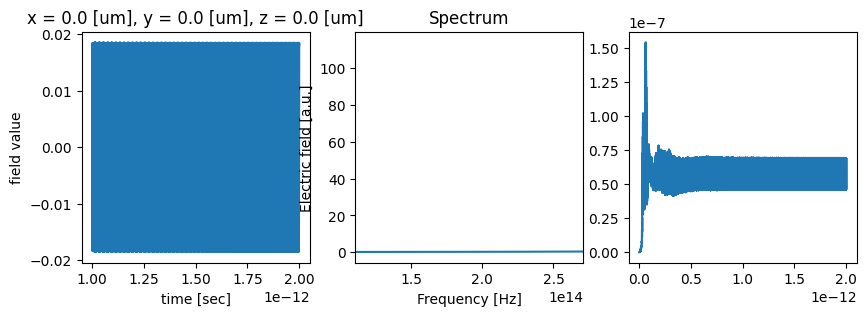

In [29]:
# Get data from the TimeMonitor
tdata = sim_data_SH["time_series"]

time_series = tdata.Ez.squeeze()

# Get data from the TimeMonitor
tdata_flux = sim_data_SH["flux_time"]

flux = tdata_flux.flux.squeeze()
time_flux = tdata_flux.flux.coords["t"]

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 3))

# Plot time dependence
time_series.plot(ax=ax1)

# Make frequency mesh and plot spectrum
dt = sim_data_SH.simulation.dt
fmesh = np.linspace(-1 / dt / 2, 1 / dt / 2, time_series.size)
spectrum = np.fft.fftshift(np.fft.fft(time_series))

ax2.plot(fmesh, np.abs(spectrum))
ax2.set_xlim(freq0 - 2 * fwidth, freq0 + 2 * fwidth)
ax2.set_xlabel("Frequency [Hz]")
ax2.set_ylabel("Electric field [a.u.]")
ax2.set_title("Spectrum")

ax3.plot(time_flux, np.abs(flux))

plt.show()

As we can see in the plots above, the fields reach a steady-state after about 0.5 ps.

Now, we can visualize the SHG fields from the resonant mode:

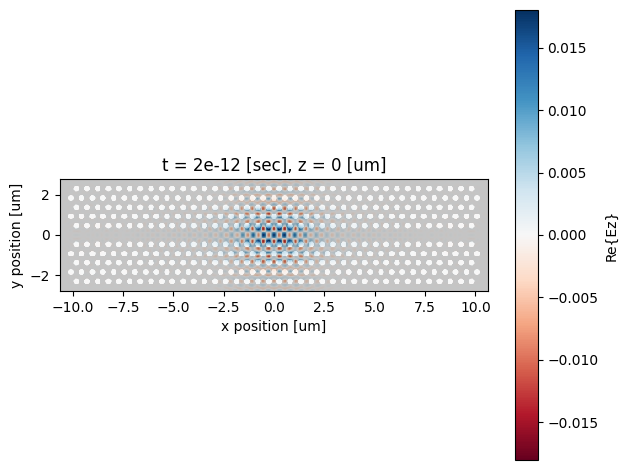

In [30]:
ax = sim_data_SH.plot_field(
    "movie_monitor",
    "Ez",
    "real",
    t=sim_data_SH["movie_monitor"].Ey.t[-1],
    z=0,
    robust=False,
    eps_alpha=0,
)

ax.pcolormesh(eps_plot.x, eps_plot.y, eps_plot.T.real, alpha=0.2, cmap="binary")


plt.show()